# ESM embeddings projections

In [1]:
import pandas as pd
pd.set_option('display.max_columns', None)

## Load the embeddings

In [2]:
X = pd.read_csv('esm_embeddings.tsv', sep='\t', header=None)

In [3]:
names = pd.read_csv('esm_embeddings_names.tsv', sep='\t', header=None)

## Split to characterized and uncharacterized

In [4]:
# Indeces of characterized sequences
char_index = names[(~names[0].str.startswith('bfd')) \
      & (~names[0].str.startswith('tsa')) \
      & (~names[0].str.startswith('uniprot')) \
      & (~names[0].str.startswith('mgnify_new')) \
      & (~names[0].str.startswith('onekp')) \
      & (~names[0].str.startswith('phytozome'))].index

In [5]:
unchar_index = names[(names[0].str.startswith('bfd')) \
      | (names[0].str.startswith('tsa')) \
      | (names[0].str.startswith('uniprot')) \
      | (names[0].str.startswith('mgnify_new')) \
      | (names[0].str.startswith('onekp')) \
      | (names[0].str.startswith('phytozome'))].index

In [6]:
characterized = X.iloc[char_index]

In [7]:
uncharacterized = X.iloc[unchar_index]

In [8]:
char_names = [name.strip('.pt') for name in names.iloc[char_index][0].tolist()]

In [9]:
unchar_names = [name.strip('.pt') for name in names.iloc[unchar_index][0].tolist()]

## Load the annotations

### Characterized

In [10]:
tps_db = pd.read_csv('~/OneDrive/Dokumenty/Uni/Mgr/2.rocnik/diplomka/tps_db_analysis/data/TPS-database_filtered_with_arch_and_motifs_unique.tsv', sep='\t')

In [30]:
tps_db.head()

,Uniprot ID,Name,Amino acid sequence,Species,"Kingdom (plant, fungi, bacteria)",pfam_architecture,supfam_architecture,motifs,"Type (mono, sesq, di, …)",pfam_architecture_l,pfam_architecture_s,supfam_architecture_l,supfam_architecture_s,type_general
0,A0A6P6W6H5,"Limonene synthase, chloroplastic",MAIINLPVPTNSSSEVNKHNHLRSCLPSGRATFTTLSAAAMRSATM...,Coffea arabica,Plantae,"['PF01397.24', 'PF03936.19']",['0048261'],"{'DDXXD', 'NSE/DTE'}",['sesq' 'mono'],"['PF01397.24', 'PF03936.19']",<PF01397.24+PF03936.19>,['0048261'],<0048261>,mixed
1,XsTC-1,NaN,MSEKNVVRIPMKWGRIEREILTQNTIPELVDTNRLISWVKECNLAD...,Xenia sp.,Coral,['PF19086.3_partial'],['0053355'],"{'DDXXD', 'NSE/DTE'}",['di' 'sesq'],['PF19086.3_partial'],<PF19086.3_partial>,['0053355'],<0053355>,mixed
2,X5AHD9,Diterpene synthase TPS4,MSITINLRVIAFPGHGVQSRQGIFAVMEFPRNKNTFKSSFAVKCSL...,Plectranthus barbatus (C. forskohlii),Plantae,"['PF01397.24', 'PF03936.19']","['0041184', '0053355']","{'DDXXD', 'NSE/DTE'}",['di'],"['PF01397.24', 'PF03936.19']",<PF01397.24+PF03936.19>,"['0041184', '0053355']",<0041184+0053355>,di
3,X5A4D6,Diterpene synthase TPS1,MGSLSTMNLNHSPMSYSGILPSSSAKAKLLLPGCFSISAWMNNGKN...,Plectranthus barbatus (C. forskohlii),Plantae,"['PF13243.9_partial', 'PF01397.24', 'PF03936.1...","['0041184', '0053355']",{'DDXXD'},['di-int'],"['PF13243.9_partial', 'PF01397.24', 'PF03936.1...",<PF13243.9_partial+PF01397.24+PF03936.19_partial>,"['0041184', '0053355']",<0041184+0053355>,di
4,X5A2Z7,Diterpene synthase TPS3,MSSLAGNLRVIPFSGNRVQTRTGILPVHQTPMITSKSSAAVKCSLT...,Plectranthus barbatus (C. forskohlii),Plantae,"['PF01397.24', 'PF03936.19']","['0041184', '0053355']","{'DDXXD', 'NSE/DTE'}",['di'],"['PF01397.24', 'PF03936.19']",<PF01397.24+PF03936.19>,"['0041184', '0053355']",<0041184+0053355>,di


In [11]:
tps_db['Species'] = tps_db['Species'].str.strip()

In [12]:
tps_db = tps_db.drop_duplicates()

### Uncharacterized

In [13]:
dbs = ['bfd','mgnify','onekp','phytozome','tsa','uniprot']
anno_l = []
for db in dbs:
    anno_df = pd.read_csv(f'../{db}_annotation.csv', index_col=0)
    anno_l.append(anno_df)

C:\Users\terca\AppData\Local\Temp\ipykernel_6588\1785099776.py:4: DtypeWarning: Columns (2,3) have mixed types. Specify dtype option on import or set low_memory=False.
  anno_df = pd.read_csv(f'../{db}_annotation.csv', index_col=0)
C:\Users\terca\AppData\Local\Temp\ipykernel_6588\1785099776.py:4: DtypeWarning: Columns (2,3) have mixed types. Specify dtype option on import or set low_memory=False.
  anno_df = pd.read_csv(f'../{db}_annotation.csv', index_col=0)
C:\Users\terca\AppData\Local\Temp\ipykernel_6588\1785099776.py:4: DtypeWarning: Columns (2,3) have mixed types. Specify dtype option on import or set low_memory=False.
  anno_df = pd.read_csv(f'../{db}_annotation.csv', index_col=0)
C:\Users\terca\AppData\Local\Temp\ipykernel_6588\1785099776.py:4: DtypeWarning: Columns (2,3) have mixed types. Specify dtype option on import or set low_memory=False.
  anno_df = pd.read_csv(f'../{db}_annotation.csv', index_col=0)


In [14]:
anno_df = pd.concat(anno_l)

In [15]:
pfam_cols = ['PF06330.14','PF01397.24', 'PF03936.19', 'PF00494.22', 'PF13249.9', 'PF19086.3','PF13243.9']
supfam_cols = ['0041184','0053354', '0053355', '0048261', '0048806', '0046340', '0047573']

## Load the Euclidian distances

In [2]:
import dask.dataframe as dd

In [3]:
e_distances_df = dd.read_csv('esm_embeddings_e_distances.tsv')

In [4]:
e_distances_df.shape

(Delayed('int-3fcf9bae-a649-44ae-9779-f4442369ce7c'), 1133)

In [5]:
e_distances_df = e_distances_df.drop('Unnamed: 0', axis=1)

In [6]:
e_distances_df.head()

,0,1,2,3,4,5,6,7,8,9,...,617318,617319,617320,617321,617322,617323,617324,617325,617326,617327
0,1.332101,1.579038,1.554752,1.810447,1.743257,1.426846,1.759098,1.713299,1.556917,1.681215,...,1.730282,1.587607,1.479829,1.789478,1.351214,1.938198,1.598817,1.802935,1.335371,1.600968
1,1.387901,1.599395,1.654850,1.800431,1.767236,1.483794,1.785658,1.804575,1.609649,1.748355,...,1.748205,1.647155,1.489006,1.917567,1.502210,1.929843,1.654310,1.817499,1.403309,1.557411
2,1.357595,1.636621,1.739138,1.875450,1.835716,1.545317,1.843911,1.846841,1.649043,1.813640,...,1.785706,1.693972,1.536886,1.943044,1.494484,2.029005,1.717554,1.893877,1.487583,1.551774
3,1.421768,1.693464,1.683833,1.881458,1.853068,1.561172,1.847243,1.837121,1.649781,1.789210,...,1.842364,1.665091,1.568534,1.906022,1.308456,2.039396,1.702817,1.885130,1.466215,1.627266
4,2.050985,2.098359,1.554520,2.215079,2.188667,1.944828,2.173966,2.080531,1.995171,2.004405,...,2.171941,1.996297,1.929059,2.058912,1.182395,2.232526,1.992478,2.203844,1.771322,2.267578


In [9]:
min_distances = pd.DataFrame(e_distances_df.min(axis=1))

In [10]:
min_distances_ids = e_distances_df.idxmin(axis=1).compute()

In [143]:
char_names[97]

'A0A1H0BVV7'

In [139]:
min_distances_ids

0           97
1       408584
2       408584
3           97
4       206283
         ...  
3075    397017
3076    397017
3077    397017
3078       254
3079    397017
Length: 616196, dtype: object

In [147]:
names

,0
0,A0A023J8Z5.pt
1,A0A059PYD5.pt
2,A0A067SEC9.pt
3,A0A075FA51.pt
4,A0A075FAK4.pt
...,...
617323,X4ZWN5.pt
617324,X5A2Z7.pt
617325,X5A4D6.pt
617326,X5AHD9.pt


In [152]:
min_distances_ids[:10000].apply(lambda x: names.iloc[int(x)])

,0
0,A0A1H0BVV7.pt
1,Q9UR08.pt
2,Q9UR08.pt
3,A0A1H0BVV7.pt
4,E4N7E5.pt
...,...
867,BDI63124.1.pt
868,Q6N3F1.pt
869,BDI63085.1.pt
870,P13513.pt


In [12]:
min_distances_names = min_distances_ids.apply(lambda x: names.iloc[int(x)])

In [19]:
min_distances.head()

,0
0,0.967490
1,1.040985
2,1.110073
3,0.986559
4,0.691916


In [21]:
pd.DataFrame(min_distances_ids).head()

,0
0,97
1,408584
2,408584
3,97
4,206283


In [18]:
min_distances_names.head()

,0
0,A0A1H0BVV7.pt
1,Q9UR08.pt
2,Q9UR08.pt
3,A0A1H0BVV7.pt
4,E4N7E5.pt


In [36]:
d = pd.DataFrame()

In [37]:
d['seq_with_min_distance_id'] = min_distances_ids.tolist()

In [38]:
d['seq_with_min_distance_name'] = min_distances_names[0].tolist()

In [39]:
d['min_distance'] = min_distances[0].tolist()

In [40]:
d['name'] = unchar_names

In [42]:
d.to_csv('min_distances.csv')

In [16]:
distances = pd.read_csv('min_distances.csv', index_col=0)

In [17]:
distances.head()

,seq_with_min_distance_id,seq_with_min_distance_name,min_distance,name
0,97,A0A1H0BVV7.pt,0.967490,bfd_000000
1,408584,Q9UR08.pt,1.040985,bfd_000001
2,408584,Q9UR08.pt,1.110073,bfd_000002
3,97,A0A1H0BVV7.pt,0.986559,bfd_000004
4,206283,E4N7E5.pt,0.691916,bfd_000012


### Checking that distances are correct

In [26]:
import numpy as np

In [34]:
np.linalg.norm(X.iloc[names[names[0]=='A0A1H0BVV7.pt'].index[0]]-X.iloc[names[names[0]=='bfd_000000.pt'].index[0]])

0.9674895448477203

In [35]:
np.linalg.norm(X.iloc[names[names[0]=='Q9UR08.pt'].index[0]]-X.iloc[names[names[0]=='bfd_000001.pt'].index[0]])

1.040985272680803

In [36]:
np.linalg.norm(X.iloc[names[names[0]=='E4N7E5.pt'].index[0]]-X.iloc[names[names[0]=='bfd_000012.pt'].index[0]])

0.691916214019687

## PCA

In [12]:
from sklearn.decomposition import PCA

In [13]:
pca = PCA()

In [14]:
emb_pca_char = pca.fit_transform(characterized)

In [15]:
emb_pca_unchar = pca.transform(uncharacterized)

In [54]:
pca_char_df = pd.DataFrame(emb_pca_char)
char_ids_column = pd.Series(char_names, name='id')
pca_char_df.insert(0, 'id', char_ids_column)

In [55]:
pca_char_df = pca_char_df.merge(tps_db, how='left', left_on='id', right_on='Uniprot ID')

In [58]:
pca_char_df.head()

,id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,Uniprot ID,Name,Amino acid sequence,Species,"Kingdom (plant, fungi, bacteria)",pfam_architecture,supfam_architecture,motifs,"Type (mono, sesq, di, …)",pfam_architecture_l,pfam_architecture_s,supfam_architecture_l,supfam_architecture_s,type_general
0,A0A023J8Z5,-0.394588,-0.079848,-0.149313,0.451304,0.261363,0.258709,0.053905,-0.196571,0.101237,-0.065702,0.038639,-0.118264,0.022995,-0.055205,0.026222,0.010536,-0.059073,0.059000,-0.035979,0.026446,0.032918,-0.062937,0.019023,-0.024875,0.046283,0.007950,-0.067233,-0.072072,0.016936,0.038187,-0.004337,0.016292,-0.032860,-0.013587,0.043299,-0.052228,0.045007,-0.040151,0.016767,-0.006193,-0.005494,-0.022061,-0.012770,0.053288,-0.003364,-0.001308,0.017715,-0.009191,-0.018219,-0.006845,0.010484,0.006565,0.009305,0.006788,-0.002667,0.023395,-0.006144,-0.033902,0.017399,-0.019118,-0.015403,0.011342,-0.013134,0.009568,0.008353,0.018993,-0.009249,0.017618,0.019313,0.032668,-0.022395,0.008347,-0.006020,0.007996,0.003480,-0.000476,0.003436,-0.005713,-0.000446,-0.017721,0.000672,-0.013367,0.002602,0.000578,0.002584,-0.001459,-0.002525,-0.008083,0.009674,0.004582,0.001628,-0.002018,0.008779,-0.001488,-0.019857,0.007712,-0.000373,-0.004704,0.020515,0.000101,-0.012503,0.001532,0.002161,0.006978,-0.017186,0.007554,0.010164,0.002524,-0.005841,-0.010723,0.008241,0.010609,0.000895,0.000322,-0.008738,-0.004711,0.000646,-0.000765,-0.002983,0.008244,0.011788,0.000650,0.002973,-0.005665,-0.004796,-0.002078,0.003413,-0.006794,0.011874,-0.008298,0.003534,0.011639,-0.003140,-0.005832,0.012676,0.006657,0.012349,-0.001577,0.000892,0.005099,0.008249,-0.002724,-0.010763,-0.001812,-0.004879,-0.002742,-0.005089,0.001397,-0.007221,-0.000559,0.004077,-0.003741,0.007795,-0.001797,0.006369,0.003147,-0.002147,-0.003084,-0.001288,-0.012551,0.007422,0.008729,-0.002065,0.003132,0.001461,-0.008056,0.005544,-0.003524,-0.006839,0.003257,0.001039,-0.003848,0.003656,0.002043,-0.002051,-0.004641,-0.001936,-0.005067,-0.000981,0.003293,-0.000984,0.003187,0.004885,0.001297,0.005585,0.003677,-0.000427,-0.003810,0.005075,0.000809,4.127551e-08,-0.004077,-0.002623,0.006308,-0.004465,-0.003019,0.004026,0.010065,-0.002492,0.001724,0.002946,0.003414,-0.000387,0.004567,-0.001647,-0.004165,0.000642,-0.001369,0.001174,0.007285,-0.005078,0.002009,-0.007849,-0.001140,0.003565,0.000235,0.002564,0.002745,-0.005278,0.005554,-0.003518,0.001216,0.002208,0.006329,0.004008,0.002029,-0.001864,0.000983,0.003235,-0.000773,0.001473,-0.000444,-0.000084,-0.002440,0.001949,0.000508,0.003143,-0.003592,0.000651,-0.000609,-0.003672,-0.001571,-0.001224,-0.003569,0.000765,0.003965,0.001674,0.005559,-0.002827,-0.000483,0.000366,-0.000129,0.001036,0.000257,0.002303,-0.001843,-0.000323,0.000353,-0.001039,0.001539,0.002691,0.002307,0.001801,-0.000330,-0.001822,-0.001344,0.000717,0.002146,0.001625,0.000438,0.002

In [59]:
pca_unchar_df = pd.DataFrame(emb_pca_unchar)
unchar_ids_column = pd.Series(unchar_names, name='id')
pca_unchar_df.insert(0, 'id', unchar_ids_column)

In [62]:
pca_unchar_df = pca_unchar_df.merge(anno_df, how='left', on='id')

In [65]:
pca_unchar_df.head()

,id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,architecture_pfam,architecture_l_pfam,PF06330.14,PF01397.24,PF03936.19,PF00494.22,PF13249.9,PF19086.3,PF13243.9,architecture_supfam,architecture_l_supfam,0041184,0053354,0053355,0048261,0048806,0046340,0047573,record_id,record_description,new_id,organism,tax_id,lineage,superkingdom,kingdom,phylum
0,bfd_000000,-0.097648,0.806166,-0.082781,0.238013,0.447328,0.261374,0.260451,-0.318902,-0.173167,0.217173,0.237335,-0.072105,0.395512,-0.063054,0.211677,0.058182,-0.011739,-0.106202,0.188759,-0.055325,-0.028703,0.097661,0.066415,-0.169153,-0.084574,0.186588,0.065753,0.069512,0.077894,-0.004216,-0.002755,0.034224,0.072398,0.047581,0.038439,-0.141943,-0.036559,0.062569,-0.062073,0.019778,-0.048485,0.018621,-0.010033,-0.044970,-0.060706,0.052936,0.023554,-0.000976,-0.034310,0.070012,0.061109,-0.019552,0.053380,-0.026192,-0.028768,0.012969,-0.007518,-0.056377,-0.042348,-0.063339,-0.041353,0.019963,0.031114,0.024329,-0.017560,0.003816,0.031865,0.008263,0.052532,0.058879,-0.049481,-0.022708,0.072882,-0.068520,0.012765,0.008495,-0.014121,0.046642,-0.012708,0.011920,-0.022002,-0.027167,0.010379,0.001783,0.000498,0.015180,0.020877,0.000903,-0.024245,0.030888,-0.014270,0.014536,-0.002582,0.014805,0.010639,0.067137,0.001441,0.002137,-0.002705,-0.028626,-0.014938,0.002149,-0.022232,-0.003125,0.003526,0.017522,-0.016139,0.039439,0.005036,-0.012718,-0.029429,-0.023185,-0.006609,-0.013967,-0.025756,-0.008312,0.022505,-0.008705,-0.003402,-0.004991,-0.021641,0.000677,-0.007212,-0.013736,-0.027713,-0.005056,0.000561,-0.001769,-0.012287,-0.023116,-0.012458,-0.004264,-0.010805,0.006443,0.023360,-0.006984,0.011138,-0.003165,0.016178,-0.016861,0.002850,0.003483,-0.008300,0.004116,0.001760,-0.004528,-0.020208,-0.000554,-0.004021,-0.000997,-0.038835,-0.001003,-0.025519,0.014733,0.013694,0.016624,0.006084,0.001832,0.039881,0.002499,-0.016873,0.011133,-0.021663,-0.029515,-0.019164,0.008109,0.006700,0.001001,-0.006374,-0.001137,0.035892,-0.002562,-0.002168,-0.004670,0.016878,-0.013178,-0.020265,0.011715,-0.018459,-0.007554,-0.000340,-0.003090,0.020107,0.011091,-0.013824,-0.017776,-0.013427,-0.007634,-0.004900,0.010626,0.004858,0.002294,-0.012639,-0.004174,0.004363,-0.010436,0.017435,0.009013,0.001206,0.012228,0.010647,-0.009662,0.011628,0.011838,-0.001348,0.001388,0.011225,-0.004386,-0.003030,0.003360,-0.017595,0.014647,0.007377,0.001807,-0.003570,0.003466,0.006443,0.007632,-0.009079,0.006401,0.012983,0.020929,-0.002411,-0.008754,0.001404,0.005438,0.006974,-0.003842,-0.010772,-0.004398,0.005907,0.007816,-0.014515,0.002552,0.006156,0.005160,-0.004748,0.005819,0.006985,0.006188,-0.000407,-0.008620,0.009025,-0.019877,-0.000177,0.002086,-0.005845,0.003465,-0.008424,0.000202,0.005667,-0.002247,-0.010646,-0.014991,-0.016886,-0.003122,-0.008508,-0.007254,-0.010900,0.018933,0.002767,-0.007484,-0.004557,0.002409,-0.00

### Plots

In [70]:
import seaborn as sns
import matplotlib.pyplot as plt

#### Characterized sequences

#### Uncharacterized sequences

##### Superkingdoms

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

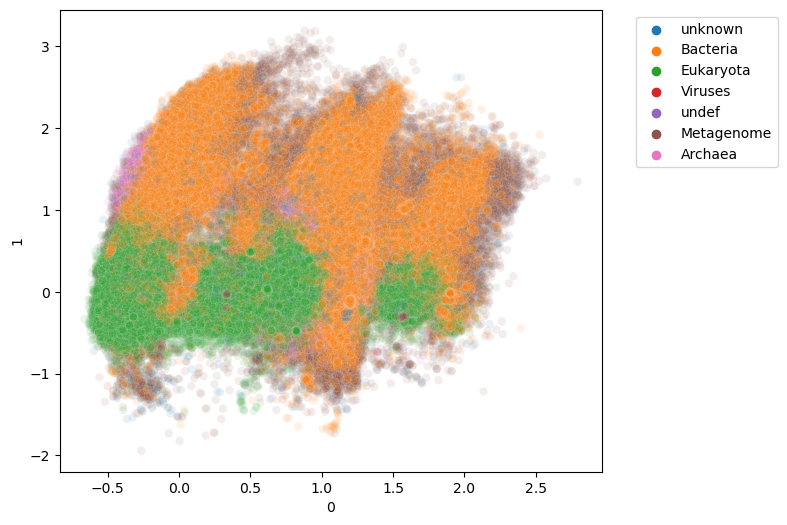

In [72]:
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.1, hue=pca_unchar_df['superkingdom'])
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

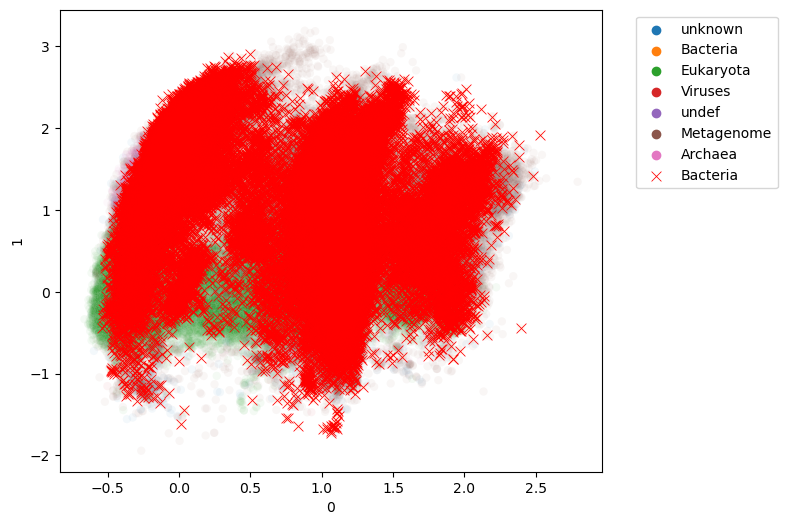

In [75]:
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, hue=pca_unchar_df['superkingdom'])
sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df['superkingdom'] == 'Bacteria', 0],
                y=pca_unchar_df.loc[pca_unchar_df['superkingdom'] == 'Bacteria', 1],
                color='red', s=50, marker='x', label='Bacteria')
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

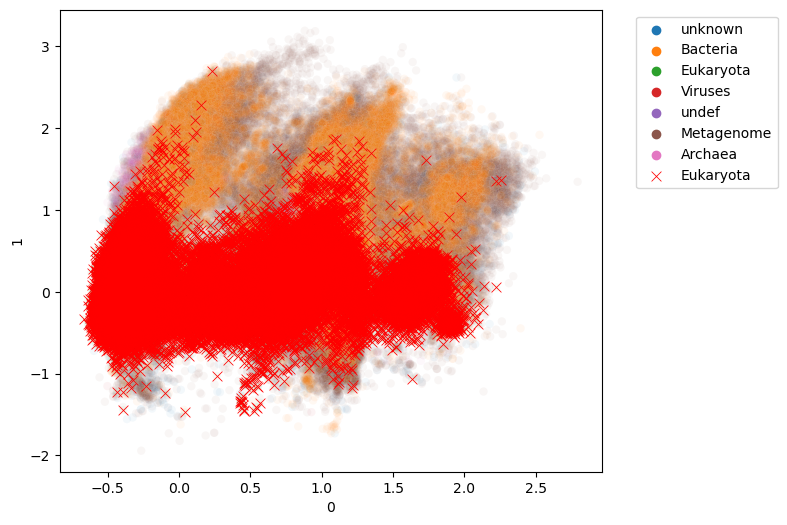

In [77]:
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, hue=pca_unchar_df['superkingdom'])
sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df['superkingdom'] == 'Eukaryota', 0],
                y=pca_unchar_df.loc[pca_unchar_df['superkingdom'] == 'Eukaryota', 1],
                color='red', s=50, marker='x', label='Eukaryota')
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

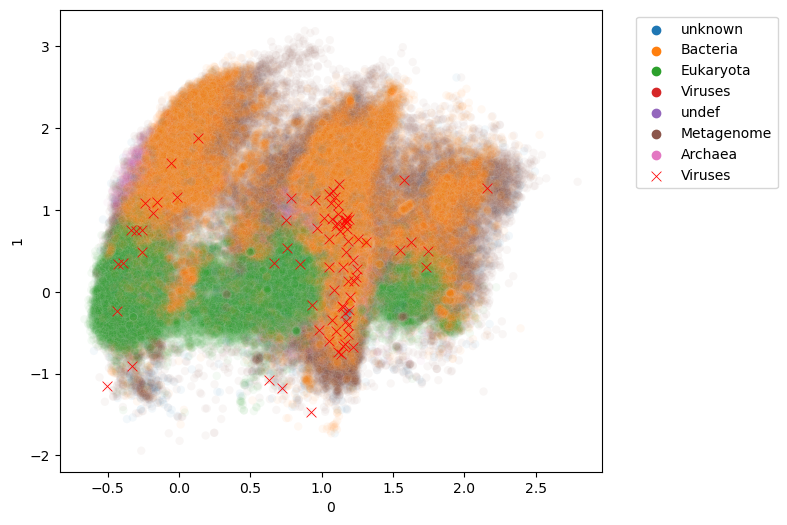

In [78]:
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, hue=pca_unchar_df['superkingdom'])
sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df['superkingdom'] == 'Viruses', 0],
                y=pca_unchar_df.loc[pca_unchar_df['superkingdom'] == 'Viruses', 1],
                color='red', s=50, marker='x', label='Viruses')
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

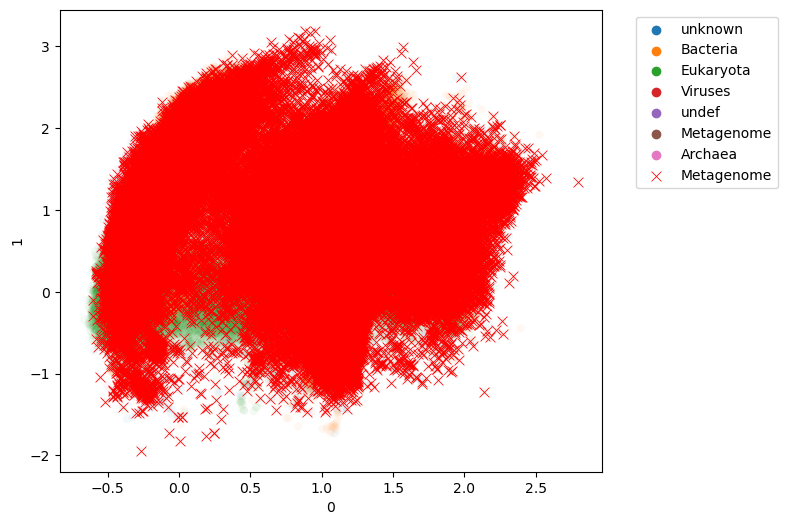

In [79]:
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, hue=pca_unchar_df['superkingdom'])
sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df['superkingdom'] == 'Metagenome', 0],
                y=pca_unchar_df.loc[pca_unchar_df['superkingdom'] == 'Metagenome', 1],
                color='red', s=50, marker='x', label='Metagenome')
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

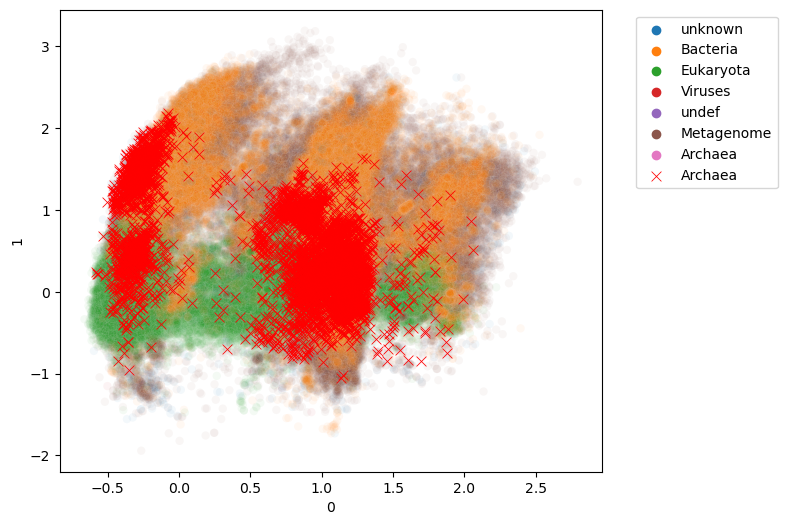

In [80]:
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, hue=pca_unchar_df['superkingdom'])
sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df['superkingdom'] == 'Archaea', 0],
                y=pca_unchar_df.loc[pca_unchar_df['superkingdom'] == 'Archaea', 1],
                color='red', s=50, marker='x', label='Archaea')
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

##### Eukaryota

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

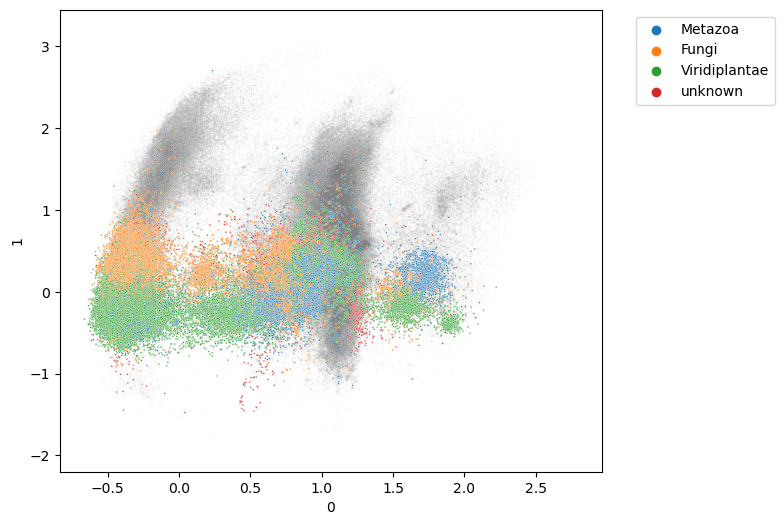

In [95]:
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df['superkingdom']=='Eukaryota',0], 
                     y=pca_unchar_df.loc[pca_unchar_df['superkingdom']=='Eukaryota',1], 
                     hue=pca_unchar_df.loc[pca_unchar_df['superkingdom']=='Eukaryota','kingdom'],
                     ax=ax, alpha=1, marker='.', s=5)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

**Metazoa**

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

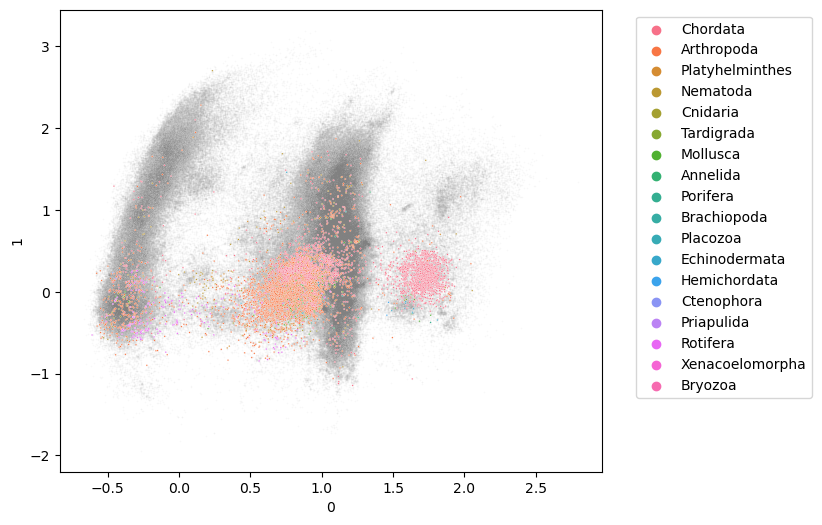

In [98]:
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df['kingdom']=='Metazoa',0], 
                     y=pca_unchar_df.loc[pca_unchar_df['kingdom']=='Metazoa',1], 
                     hue=pca_unchar_df.loc[pca_unchar_df['kingdom']=='Metazoa','phylum'],
                     ax=ax, alpha=1, marker='.', s=5)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

##### Pfam domains

In [ ]:
pfam_cols = ['PF06330.14','PF01397.24', 'PF03936.19', 'PF00494.22', 'PF13249.9', 'PF19086.3','PF13243.9']


**PF06330**

In [99]:
pfam_dom = 'PF06330.14'

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

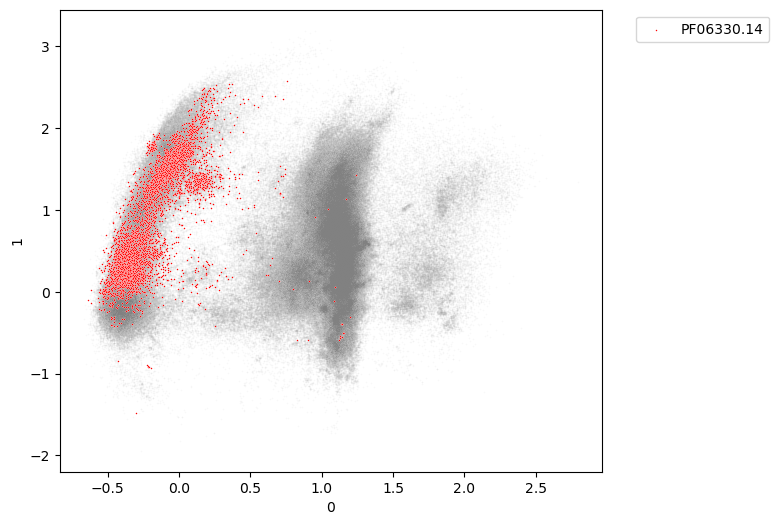

In [101]:
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,0], 
                     y=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

**PF01397**

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

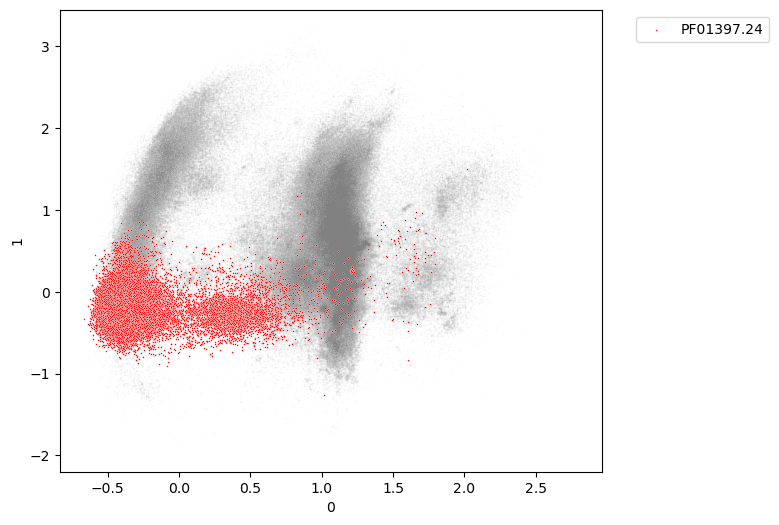

In [102]:
pfam_dom='PF01397.24'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,0], 
                     y=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

**PF03936**

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

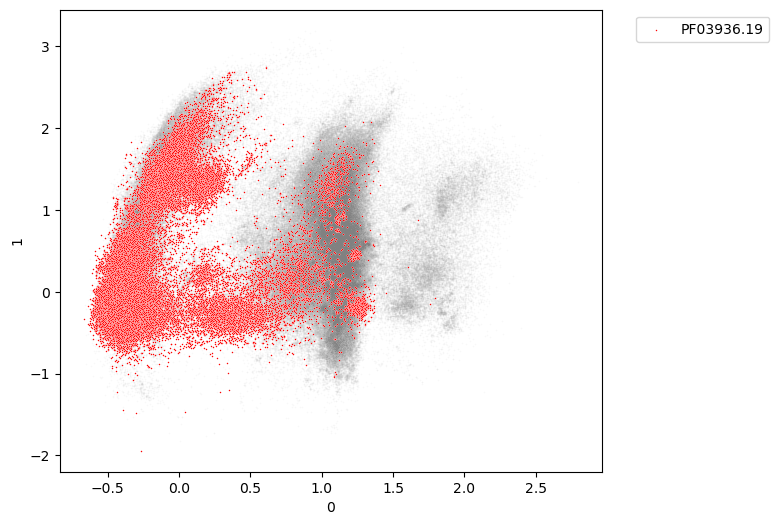

In [103]:
pfam_dom='PF03936.19'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,0], 
                     y=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

**PF00494** 

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

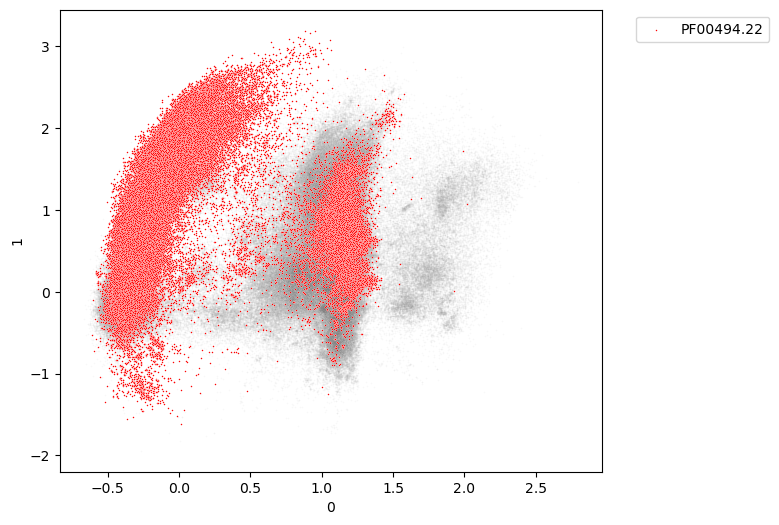

In [104]:
pfam_dom='PF00494.22'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,0], 
                     y=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

**PF13249**

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

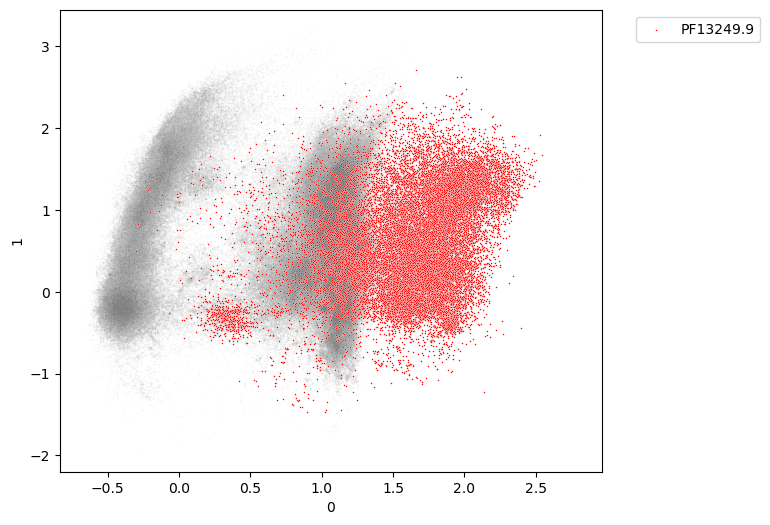

In [107]:
pfam_dom='PF13249.9'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,0], 
                     y=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

**PF13243**

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

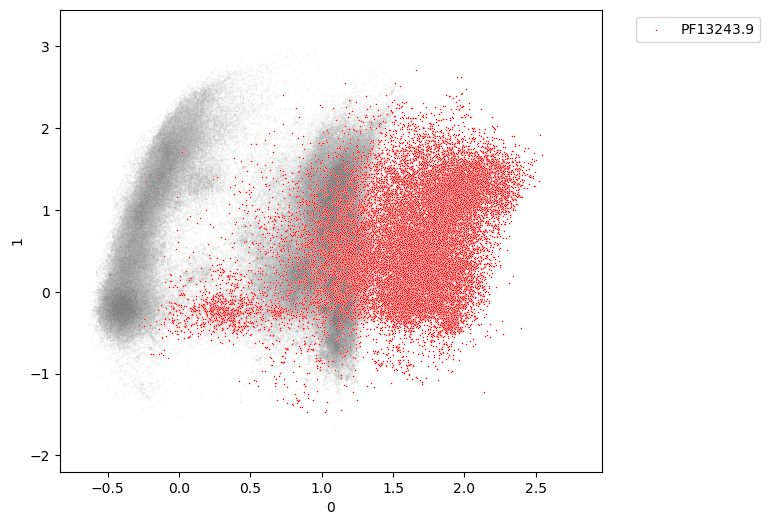

In [108]:
pfam_dom='PF13243.9'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,0], 
                     y=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

**PF19086**

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

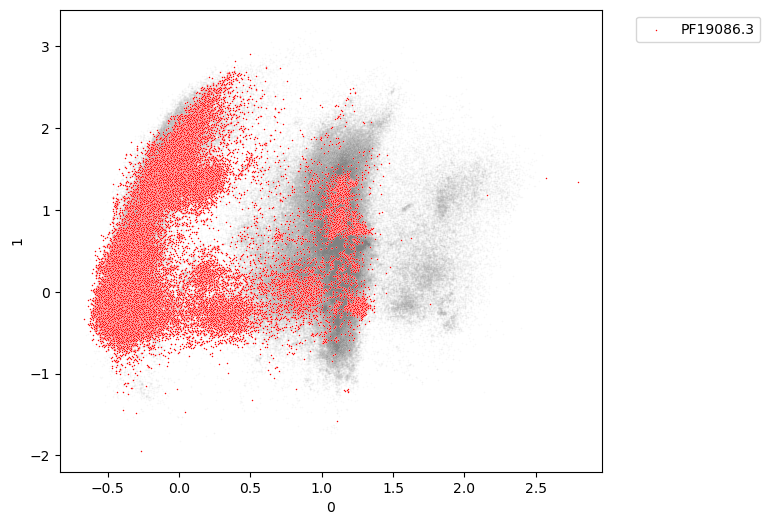

In [109]:
pfam_dom='PF19086.3'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,0], 
                     y=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

##### Supfam domains

In [ ]:
supfam_cols = ['0041184','0053354', '0053355', '0048261', '0048806', '0046340', '0047573']

**41184**

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

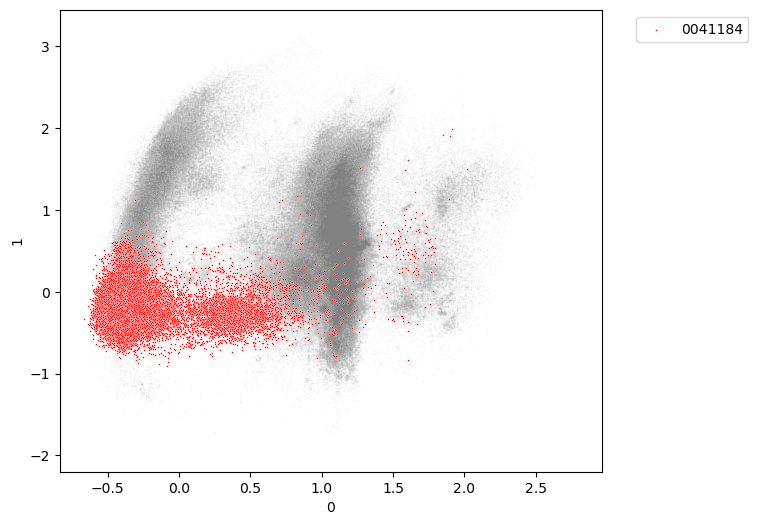

In [110]:
pfam_dom='0041184'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,0], 
                     y=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

**53354**

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

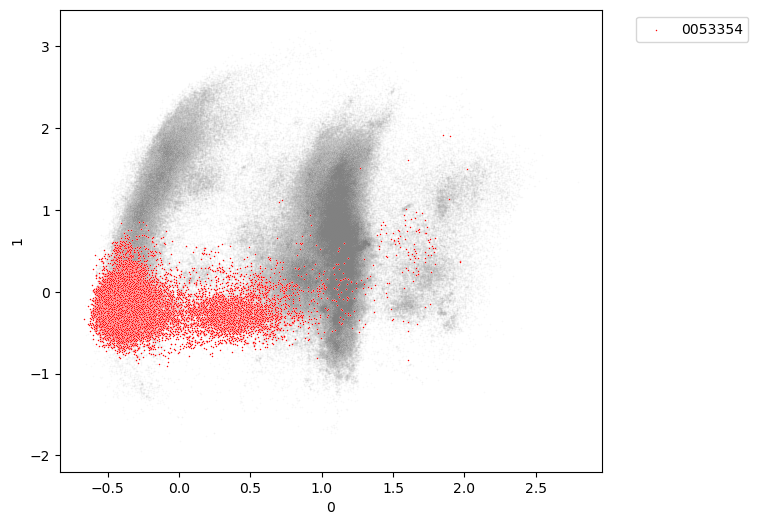

In [111]:
pfam_dom='0053354'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,0], 
                     y=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

**53355**

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

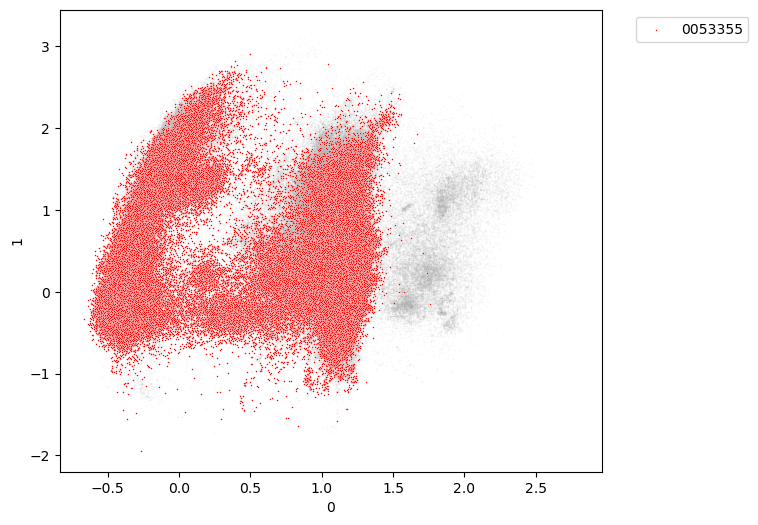

In [112]:
pfam_dom='0053355'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,0], 
                     y=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

**48261**

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

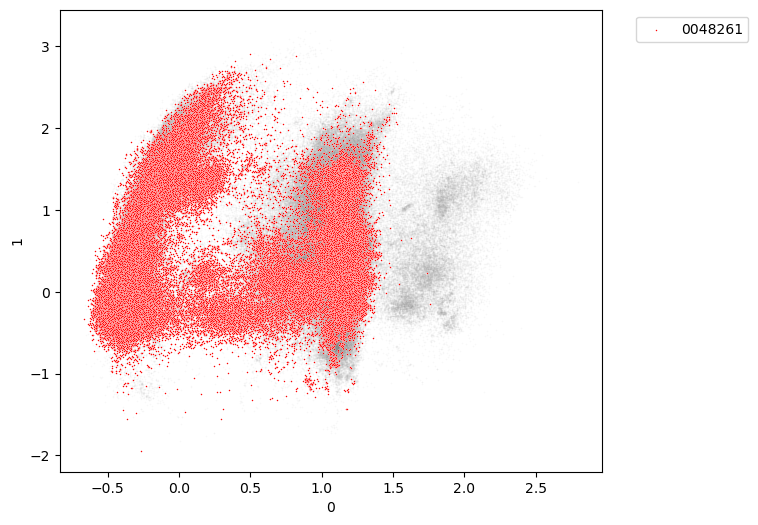

In [113]:
pfam_dom='0048261'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,0], 
                     y=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

**48806**

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

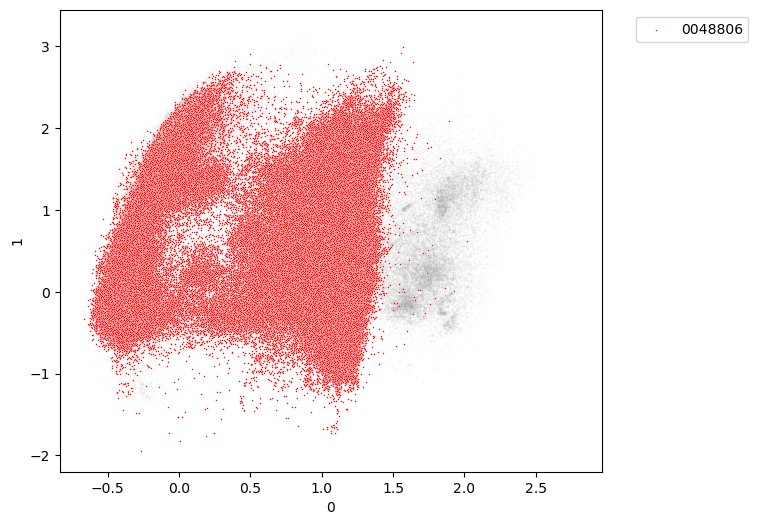

In [114]:
pfam_dom='0048806'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,0], 
                     y=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

**46340**

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

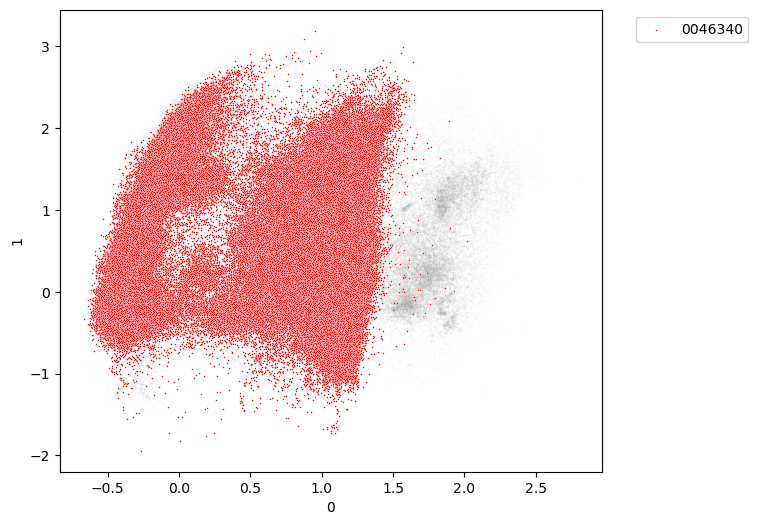

In [115]:
pfam_dom='0046340'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,0], 
                     y=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

**47573**

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

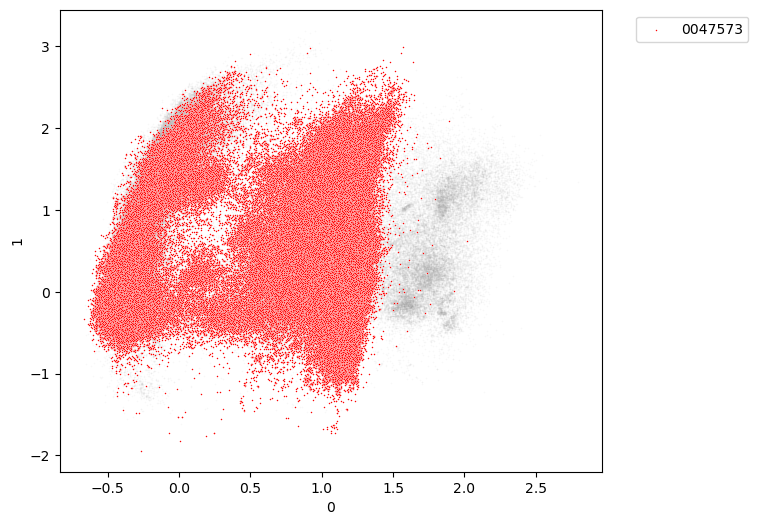

In [116]:
pfam_dom='0047573'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=pca_unchar_df[0], y=pca_unchar_df[1], ax=ax, alpha=0.05, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,0], 
                     y=pca_unchar_df.loc[pca_unchar_df[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

## UMAP - trained on characterized

In [41]:
import pickle
import lzma

In [37]:
import umap

In [38]:
reducer = umap.UMAP()

In [39]:
emb_umap_char = reducer.fit_transform(characterized)

In [42]:
# Save the fitted model
with lzma.open('umap_esm_char', "wb") as model_file:
    pickle.dump(reducer, model_file)

In [43]:
# Calculate UMAP embeddings projections in chunks

chunk_size = 1000  

emb_umap_unchar_l = []

for i in range(0, len(uncharacterized), chunk_size):
    uncharacterized_chunk = uncharacterized.iloc[i:i+chunk_size]
    umap_chunk =reducer.transform(uncharacterized_chunk)
    emb_umap_unchar_l.append(umap_chunk)
emb_umap_unchar = np.concatenate(emb_umap_unchar_l)

In [45]:
emb_umap_unchar.shape

(616196, 2)

### Characterized df with embeddings

In [46]:
umap_char_df = pd.DataFrame(emb_umap_char)
char_ids_column = pd.Series(char_names, name='id')
umap_char_df.insert(0, 'id', char_ids_column)

In [47]:
umap_char_df = umap_char_df.merge(tps_db, how='left', left_on='id', right_on='Uniprot ID')

In [49]:
umap_char_df.head()

,id,0,1,Uniprot ID,Name,Amino acid sequence,Species,"Kingdom (plant, fungi, bacteria)",pfam_architecture,supfam_architecture,motifs,"Type (mono, sesq, di, …)",pfam_architecture_l,pfam_architecture_s,supfam_architecture_l,supfam_architecture_s,type_general
0,A0A023J8Z5,1.180724,8.526373,A0A023J8Z5,Delta guaiene synthase,MSSAKLGSASEDVSRRDANYHPTVWGDFFLTHSSNFLENNHSILEK...,Aquilaria microcarpa,Plantae,"['PF01397.24', 'PF03936.19']",['0048261'],"{'DDXXD', 'NSE/DTE'}",['sesq'],"['PF01397.24', 'PF03936.19']",<PF01397.24+PF03936.19>,['0048261'],<0048261>,sesq
1,A0A059PYD5,0.381160,9.553713,A0A059PYD5,Caryophyllene synthase,MDMPAKEEKVIRPIVHFPPSVWADQFLIFDDKQAEQANIEQVVNEL...,Artemisia annua,Plantae,"['PF01397.24', 'PF03936.19']",['0048261'],"{'DDXXD', 'NSE/DTE'}",['mono'],"['PF01397.24', 'PF03936.19']",<PF01397.24+PF03936.19>,['0048261'],<0048261>,mono
2,A0A067SEC9,-2.488871,8.214253,A0A067SEC9,Sesquiterpene synthase GALMADRAFT_104215,MNTTTRTFYLPRLEDTFSVFPDNGLNPHYAECRIQSQAWIDKYYKI...,Galerina marginata,Fungi,['PF19086.3'],['0047573'],{'NSE/DTE'},['sesq'],['PF19086.3'],<PF19086.3>,['0047573'],<0047573>,sesq
3,A0A075FA51,13.189483,15.257491,A0A075FA51,"(+)-copalyl diphosphate synthase 3, chloroplastic",MGSLSTLNLIKTCVTLASSEKLNQPSQCYTISTCMKSSNNPPFNYY...,Marrubium vulgare,Plantae,"['PF13243.9_partial', 'PF01397.24', 'PF03936.1...","['0041184', '0053355']",NaN,['di-int'],"['PF13243.9_partial', 'PF01397.24', 'PF03936.1...",<PF13243.9_partial+PF01397.24+PF03936.19_parti...,"['0041184', '0053355']",<0041184+0053355>,di
4,A0A075FAK4,13.335058,15.379509,A0A075FAK4,Peregrinol diphosphate synthase CPS1,MASTPTLNLSITTPFVRTKIPAKISLPACSWLDRSSSRHVELNHKF...,Marrubium vulgare,Plantae,"['PF01397.24', 'PF03936.19_partial', 'PF03936....","['0041184', '0053355']",NaN,['di-int'],"['PF01397.24', 'PF03936.19_partial', 'PF03936....",<PF01397.24+PF03936.19_partial+PF03936.19_part...,"['0041184', '0053355']",<0041184+0053355>,di


In [50]:
umap_char_df.to_csv('umap_char_df.csv')

### Uncharacterized df with embeddings

In [51]:
umap_unchar_df = pd.DataFrame(emb_umap_unchar)
unchar_ids_column = pd.Series(unchar_names, name='id')
umap_unchar_df.insert(0, 'id', unchar_ids_column)

In [53]:
umap_unchar_df = umap_unchar_df.merge(anno_df, how='left', on='id')

In [54]:
umap_unchar_df.to_csv('umap_unchar_df.csv')

In [55]:
umap_unchar_df

,id,0,1,architecture_pfam,architecture_l_pfam,PF06330.14,PF01397.24,PF03936.19,PF00494.22,PF13249.9,PF19086.3,PF13243.9,architecture_supfam,architecture_l_supfam,0041184,0053354,0053355,0048261,0048806,0046340,0047573,record_id,record_description,new_id,organism,tax_id,lineage,superkingdom,kingdom,phylum
0,bfd_000000,-3.081954,8.411378,['PF00494.22'],['PF00494.22'],0.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GraSoiStandDraft_39_1057311.scaffolds.fasta_sc...,GraSoiStandDraft_39_1057311.scaffolds.fasta_sc...,bfd_000000,unknown,error,error,unknown,unknown,unknown
1,bfd_000001,-3.038212,8.581336,['PF00494.22'],['PF00494.22'],0.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GraSoiStandDraft_55_1057291.scaffolds.fasta_sc...,GraSoiStandDraft_55_1057291.scaffolds.fasta_sc...,bfd_000001,unknown,error,error,unknown,unknown,unknown
2,bfd_000002,-2.958781,8.405518,['PF00494.22'],['PF00494.22'],0.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GraSoiStandDraft_55_1057291.scaffolds.fasta_sc...,GraSoiStandDraft_55_1057291.scaffolds.fasta_sc...,bfd_000002,unknown,error,error,unknown,unknown,unknown
3,bfd_000004,-3.167401,8.100253,['PF00494.22'],['PF00494.22'],0.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,APCry1669189440_1035222.scaffolds.fasta_scaffo...,APCry1669189440_1035222.scaffolds.fasta_scaffo...,bfd_000004,unknown,error,error,unknown,unknown,unknown
4,bfd_000012,-4.090565,6.588788,['PF00494.22'],['PF00494.22'],0.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,APIni6443716594_1056825.scaffolds.fasta_scaffo...,APIni6443716594_1056825.scaffolds.fasta_scaffo...,bfd_000012,unknown,error,error,unknown,unknown,unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
616191,uniprot_266129,15.691239,2.221610,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,['0046340'],['0046340'],0.0,0.0,0.0,0.0,1.0,1.0,0.0,NoUniProtID,NoUniProtID\torganism: Agrobacterium leguminum...,uniprot_266129,Agrobacterium leguminum,2792015,"{'species': 'Agrobacterium leguminum', 'genus'...",Bacteria,unknown,Pseudomonadota
616192,uniprot_266130,15.607905,2.275190,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,['0046340'],['0046340'],0.0,0.0,0.0,0.0,1.0,1.0,1.0,NoUniProtID,NoUniProtID\torganism: Streptomyces sp. CMSTAA...,uniprot_266130,Streptomyces sp. CMSTAAHL-2,2904522,"{'species': 'Streptomyces sp. CMSTAAHL-2', 'ge...",Bacteria,unknown,Actinomycetota
616193,uniprot_266131,15.736487,2.189439,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,['0046340'],['0046340'],0.0,0.0,0.0,0.0,1.0,1.0,0.0,NoUniProtID,NoUniProtID\torganism: Agrobacterium; Agrobact...,uniprot_266131,Agrobacterium,357,"{'genus': 'Agrobacterium', 'family': 'Rhizobia...",Bacteria,unknown,Pseudomonadota
616194,uniprot_266132,15.718855,2.196337,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,['0046340'],['0046340'],0.0,0.0,0.0,0.0,1.0,1.0,1.0,NoUniProtID,NoUniProtID\torganism: Agrobacterium leguminum...,uniprot_266132,Agrobacterium leguminum,2792015,"{'species': 'Agrobacterium leguminum', 'genus'...",Bacteria,unknown,Pseudomonadota


### Plots

In [56]:
import seaborn as sns
import matplotlib.pyplot as plt

#### Uncharacterized sequences

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


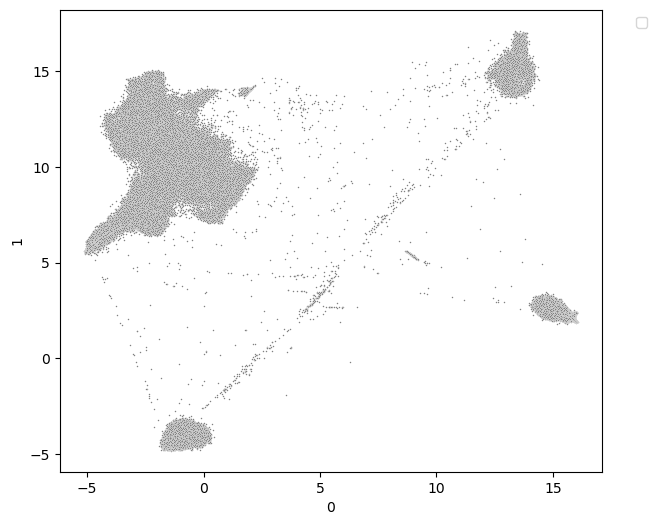

In [57]:
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=umap_unchar_df[0], y=umap_unchar_df[1], ax=ax, color='grey', marker='.', s=5)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

##### Superkingdoms

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

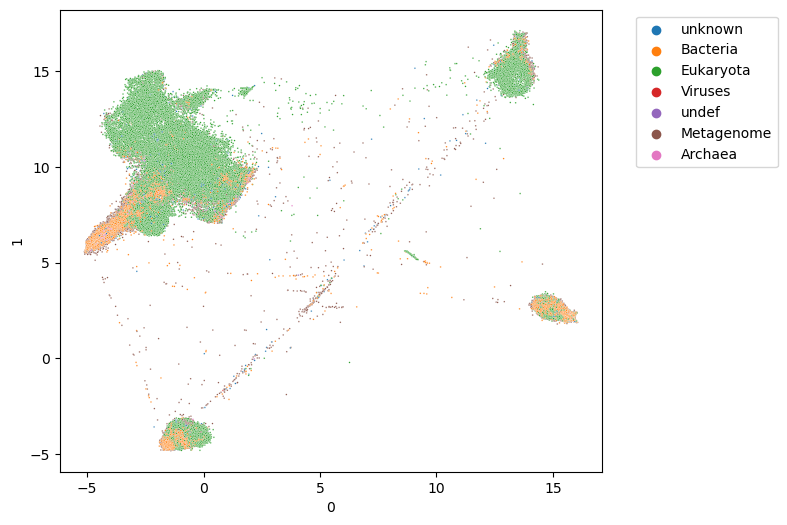

In [58]:
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=umap_unchar_df[0], y=umap_unchar_df[1], ax=ax, hue=umap_unchar_df['superkingdom'], marker='.', s=5)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

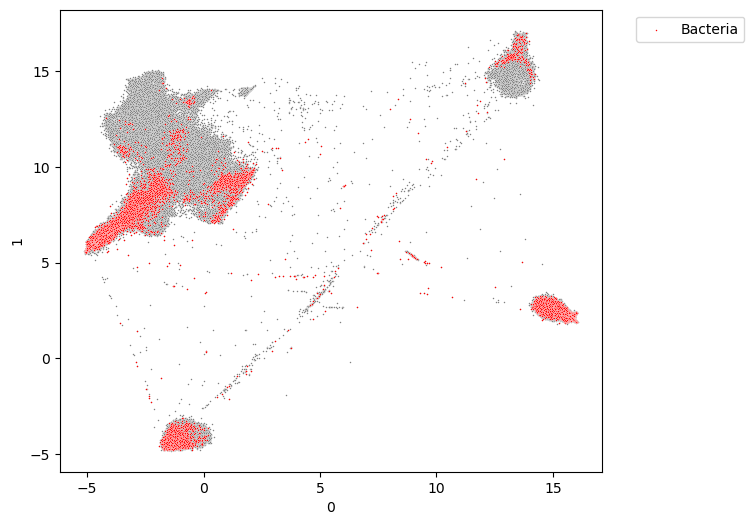

In [61]:
superkingdom='Bacteria'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=umap_unchar_df[0], y=umap_unchar_df[1], ax=ax, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=umap_unchar_df.loc[umap_unchar_df['superkingdom']==superkingdom,0], 
                     y=umap_unchar_df.loc[umap_unchar_df['superkingdom']==superkingdom,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=superkingdom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

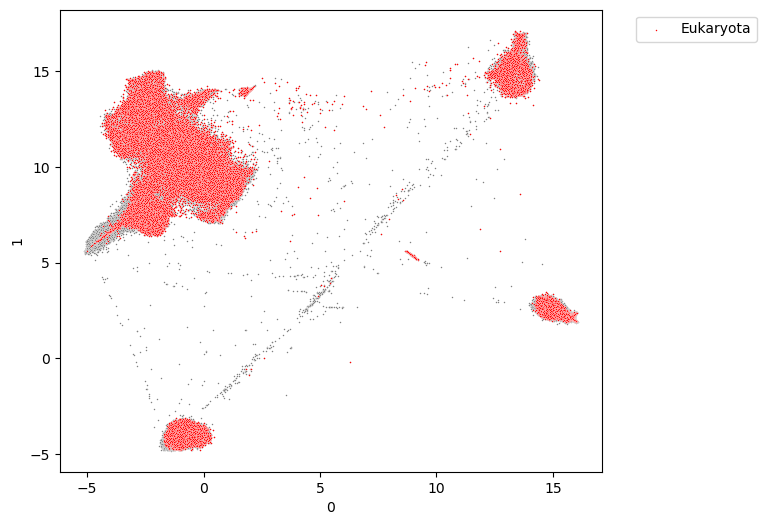

In [62]:
superkingdom='Eukaryota'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=umap_unchar_df[0], y=umap_unchar_df[1], ax=ax, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=umap_unchar_df.loc[umap_unchar_df['superkingdom']==superkingdom,0], 
                     y=umap_unchar_df.loc[umap_unchar_df['superkingdom']==superkingdom,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=superkingdom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

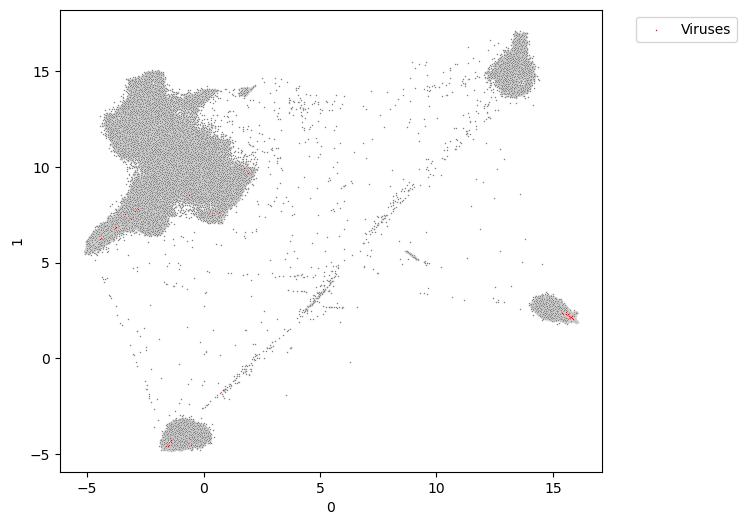

In [63]:
superkingdom='Viruses'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=umap_unchar_df[0], y=umap_unchar_df[1], ax=ax, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=umap_unchar_df.loc[umap_unchar_df['superkingdom']==superkingdom,0], 
                     y=umap_unchar_df.loc[umap_unchar_df['superkingdom']==superkingdom,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=superkingdom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

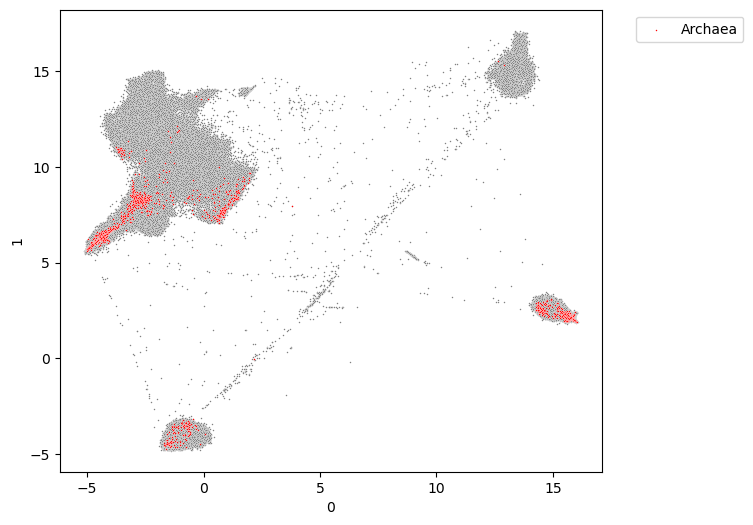

In [64]:
superkingdom='Archaea'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=umap_unchar_df[0], y=umap_unchar_df[1], ax=ax, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=umap_unchar_df.loc[umap_unchar_df['superkingdom']==superkingdom,0], 
                     y=umap_unchar_df.loc[umap_unchar_df['superkingdom']==superkingdom,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=superkingdom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

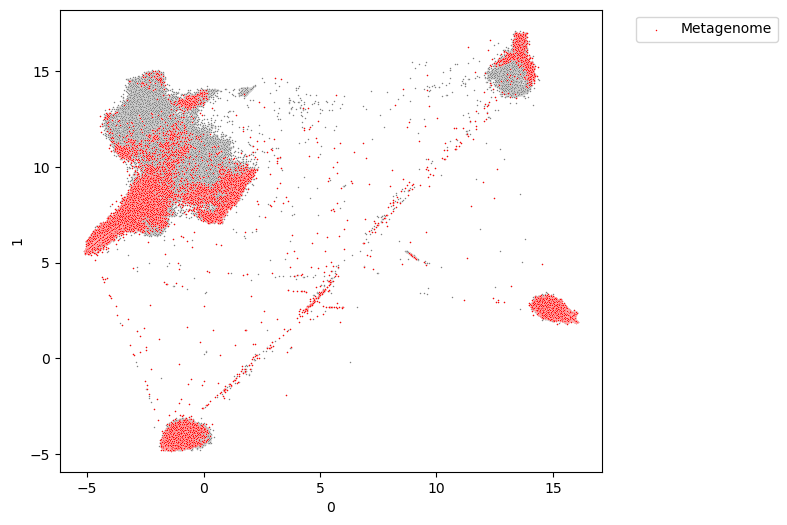

In [65]:
superkingdom='Metagenome'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=umap_unchar_df[0], y=umap_unchar_df[1], ax=ax, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=umap_unchar_df.loc[umap_unchar_df['superkingdom']==superkingdom,0], 
                     y=umap_unchar_df.loc[umap_unchar_df['superkingdom']==superkingdom,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=superkingdom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

##### Eukaryota

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

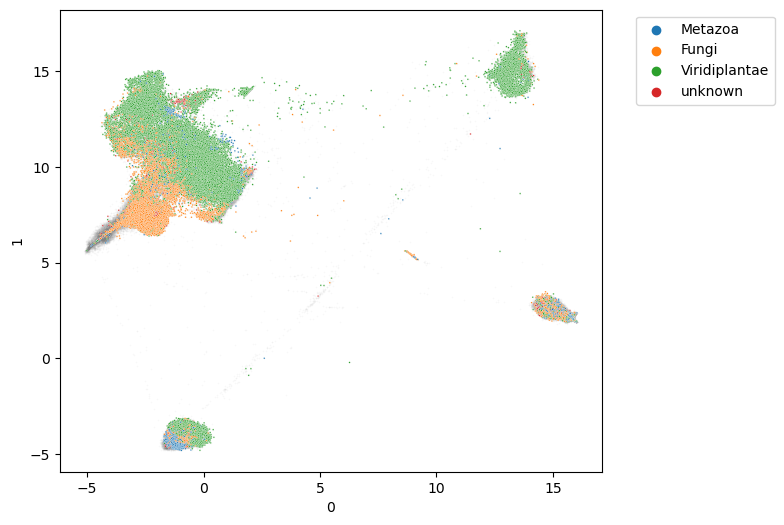

In [66]:
unchar_data = umap_unchar_df
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=unchar_data[0], y=unchar_data[1], ax=ax, alpha=0.05, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=unchar_data.loc[unchar_data['superkingdom']=='Eukaryota',0], 
                     y=unchar_data.loc[unchar_data['superkingdom']=='Eukaryota',1], 
                     hue=unchar_data.loc[unchar_data['superkingdom']=='Eukaryota','kingdom'],
                     ax=ax, alpha=1, marker='.', s=5)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

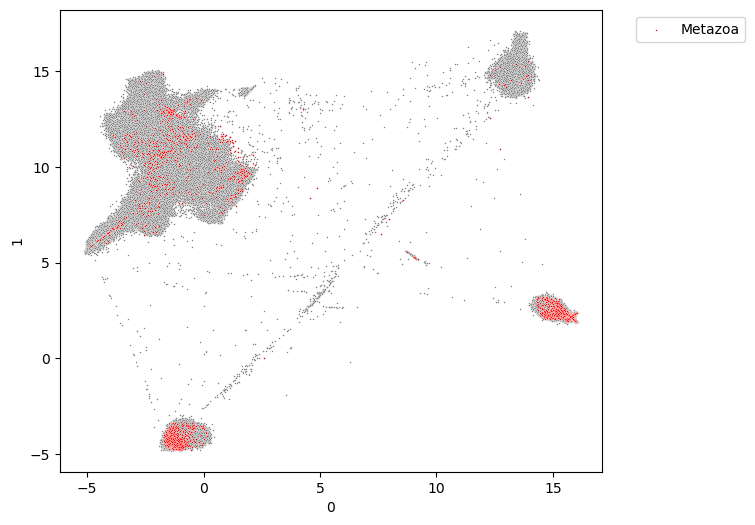

In [67]:
unchar_data = umap_unchar_df
kingdom='Metazoa'

fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=unchar_data[0], y=unchar_data[1], ax=ax, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=unchar_data.loc[unchar_data['kingdom']==kingdom,0], 
                     y=unchar_data.loc[unchar_data['kingdom']==kingdom,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=kingdom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

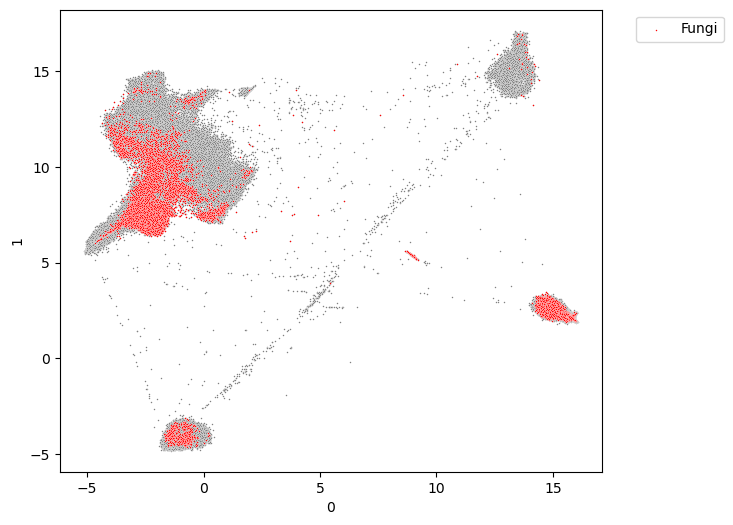

In [68]:
unchar_data = umap_unchar_df
kingdom='Fungi'

fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=unchar_data[0], y=unchar_data[1], ax=ax, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=unchar_data.loc[unchar_data['kingdom']==kingdom,0], 
                     y=unchar_data.loc[unchar_data['kingdom']==kingdom,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=kingdom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

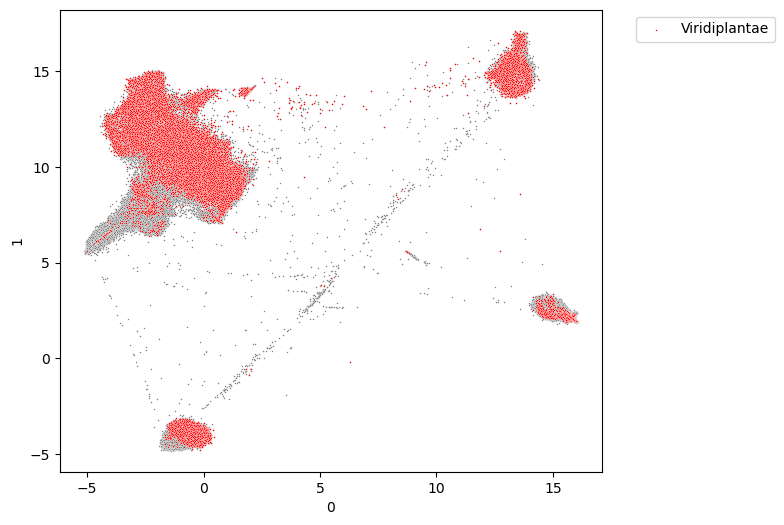

In [69]:
unchar_data = umap_unchar_df
kingdom='Viridiplantae'

fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=unchar_data[0], y=unchar_data[1], ax=ax, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=unchar_data.loc[unchar_data['kingdom']==kingdom,0], 
                     y=unchar_data.loc[unchar_data['kingdom']==kingdom,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=kingdom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

##### Pfam domains

In [88]:
pfam_cols

['PF06330.14',
 'PF01397.24',
 'PF03936.19',
 'PF00494.22',
 'PF13249.9',
 'PF19086.3',
 'PF13243.9']

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

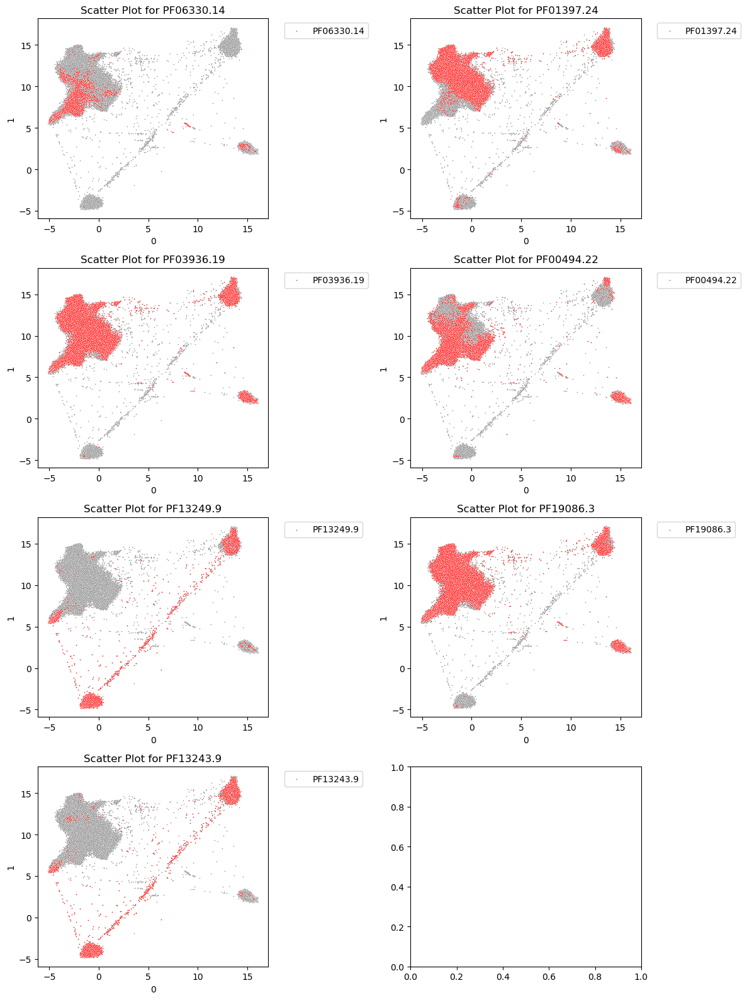

In [93]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming umap_unchar_df is defined and imported
unchar_data = umap_unchar_df

# Set up the subplots in a 4x2 grid
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 16))

# Flatten the 4x2 array of subplots for easier iteration
axes = axes.flatten()

# Iterate through each PFAM domain and create a scatter plot
for i, pfam_dom in enumerate(pfam_cols):
    ax = axes[i]
    sc = sns.scatterplot(x=unchar_data[0], y=unchar_data[1], ax=ax, marker='.', s=5, color='grey')
    sc = sns.scatterplot(x=unchar_data.loc[unchar_data[pfam_dom]==1, 0], 
                         y=unchar_data.loc[unchar_data[pfam_dom]==1, 1], 
                         color='red',
                         ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
    legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.set_title(f'Scatter Plot for {pfam_dom}')

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()


###### Detailed view

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

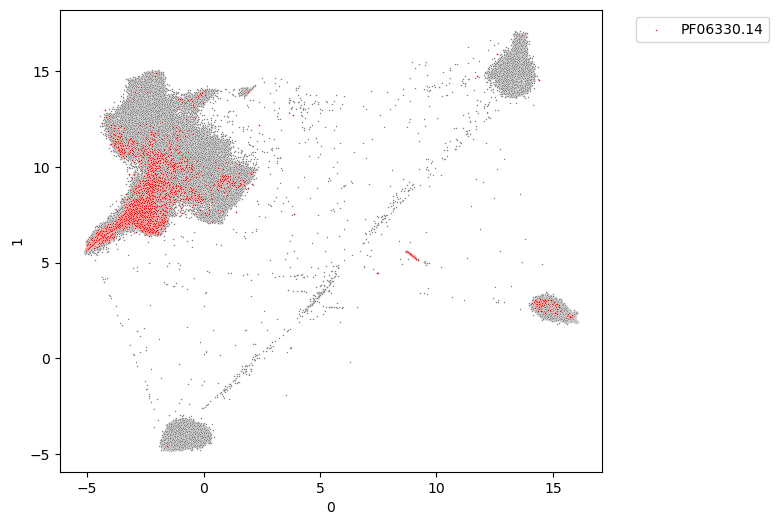

In [77]:
unchar_data = umap_unchar_df
pfam_dom = 'PF06330.14'

fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=unchar_data[0], y=unchar_data[1], ax=ax, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=unchar_data.loc[unchar_data[pfam_dom]==1,0], 
                     y=unchar_data.loc[unchar_data[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

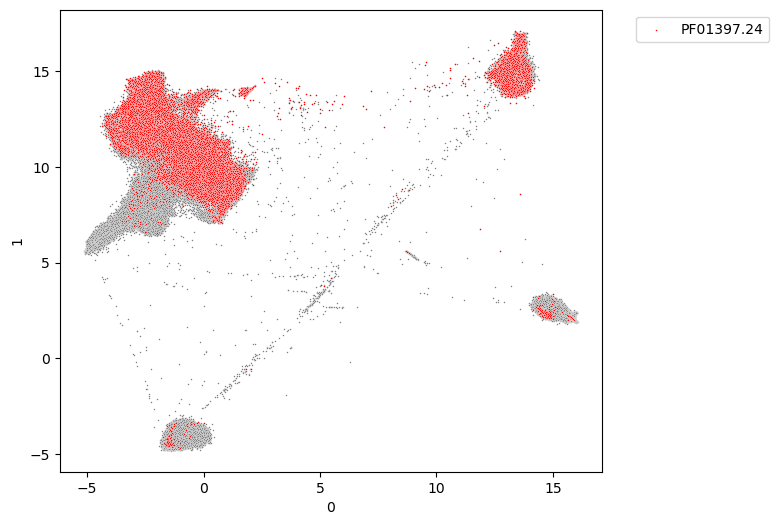

In [73]:
unchar_data = umap_unchar_df

pfam_dom='PF01397.24'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=unchar_data[0], y=unchar_data[1], ax=ax, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=unchar_data.loc[unchar_data[pfam_dom]==1,0], 
                     y=unchar_data.loc[unchar_data[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

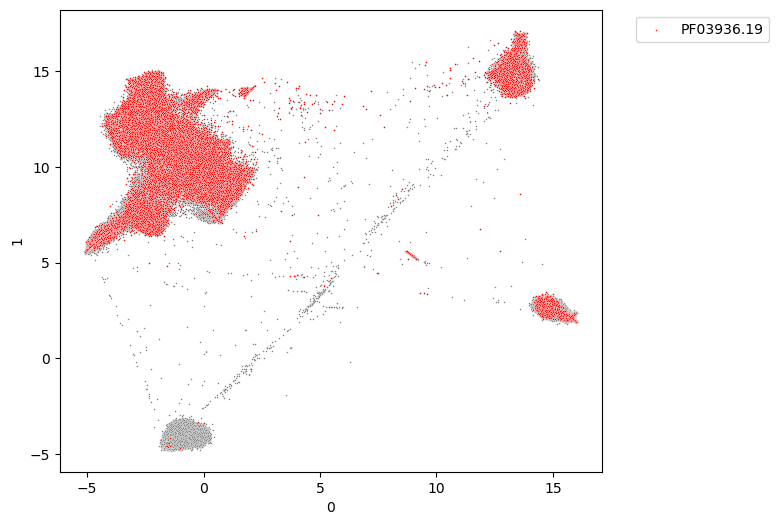

In [74]:
unchar_data = umap_unchar_df
pfam_dom='PF03936.19'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=unchar_data[0], y=unchar_data[1], ax=ax, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=unchar_data.loc[unchar_data[pfam_dom]==1,0], 
                     y=unchar_data.loc[unchar_data[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

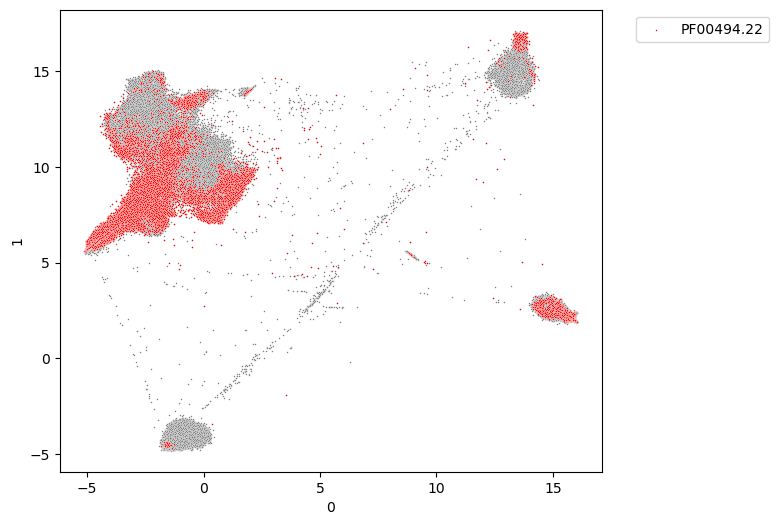

In [76]:
unchar_data = umap_unchar_df
pfam_dom='PF00494.22'
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=unchar_data[0], y=unchar_data[1], ax=ax, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=unchar_data.loc[unchar_data[pfam_dom]==1,0], 
                     y=unchar_data.loc[unchar_data[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

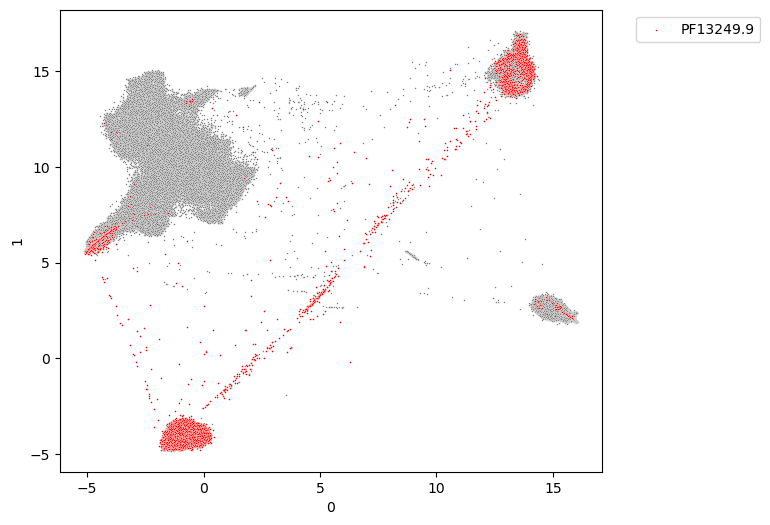

In [78]:
pfam_dom='PF13249.9'
unchar_data = umap_unchar_df
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=unchar_data[0], y=unchar_data[1], ax=ax, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=unchar_data.loc[unchar_data[pfam_dom]==1,0], 
                     y=unchar_data.loc[unchar_data[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

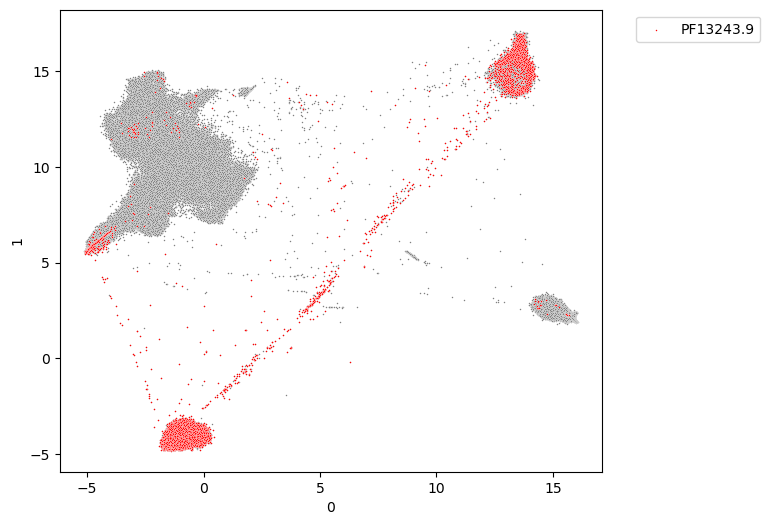

In [79]:
pfam_dom='PF13243.9'
unchar_data = umap_unchar_df
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=unchar_data[0], y=unchar_data[1], ax=ax, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=unchar_data.loc[unchar_data[pfam_dom]==1,0], 
                     y=unchar_data.loc[unchar_data[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

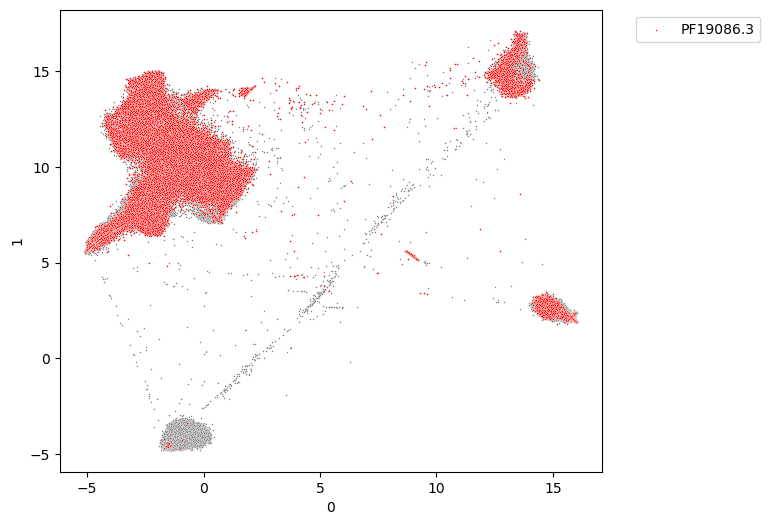

In [80]:
pfam_dom='PF19086.3'
unchar_data = umap_unchar_df
fig_dims = (7, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sc = sns.scatterplot(x=unchar_data[0], y=unchar_data[1], ax=ax, marker='.', s=5, color='grey')
sc = sns.scatterplot(x=unchar_data.loc[unchar_data[pfam_dom]==1,0], 
                     y=unchar_data.loc[unchar_data[pfam_dom]==1,1], 
                     color='red',
                     ax=ax, alpha=1, marker='.', s=5, label=pfam_dom)
legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

##### Supfam domains

In [94]:
supfam_cols

['0041184', '0053354', '0053355', '0048261', '0048806', '0046340', '0047573']

C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\terca\anaconda3\envs\esm_env\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

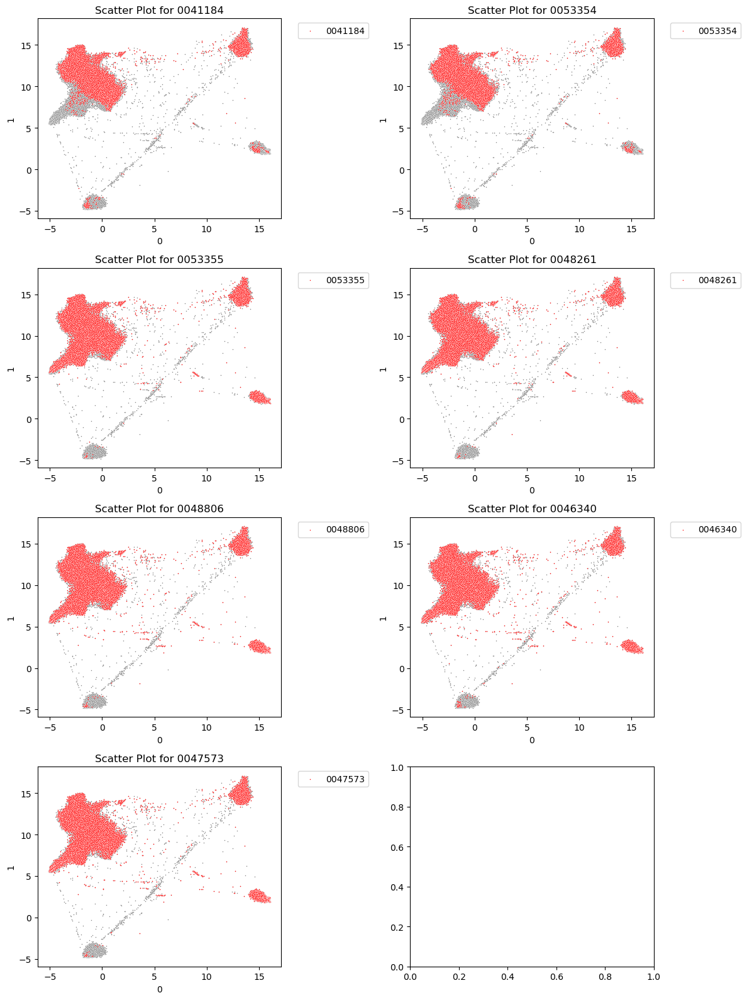

In [95]:
# Assuming umap_unchar_df is defined and imported
unchar_data = umap_unchar_df

# Set up the subplots in a 4x2 grid
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 16))

# Flatten the 4x2 array of subplots for easier iteration
axes = axes.flatten()

# Iterate through each PFAM domain and create a scatter plot
for i, supfam_dom in enumerate(supfam_cols):
    ax = axes[i]
    sc = sns.scatterplot(x=unchar_data[0], y=unchar_data[1], ax=ax, marker='.', s=5, color='grey')
    sc = sns.scatterplot(x=unchar_data.loc[unchar_data[supfam_dom]==1, 0], 
                         y=unchar_data.loc[unchar_data[supfam_dom]==1, 1], 
                         color='red',
                         ax=ax, alpha=1, marker='.', s=5, label=supfam_dom)
    legend = ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.set_title(f'Scatter Plot for {supfam_dom}')

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()